<a href="https://colab.research.google.com/github/melihkurtaran/ImageAnalysisProject/blob/main/ImageProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Dowloading and Importing Libraries**

In [88]:
!pip install --upgrade scikit-image

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [89]:
!pip install pixelmatch

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [90]:
import cv2
import numpy as np
import pandas as pd
import os
import glob
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow
from PIL import Image
from pixelmatch.contrib.PIL import pixelmatch
from numpy import asarray

# **GitHub Data Access**

In [91]:
!git clone https://github.com/melihkurtaran/ImageAnalysisProject.git

fatal: destination path 'ImageAnalysisProject' already exists and is not an empty directory.


In [92]:
# storing the images in data folder
image_files = glob.glob ("ImageAnalysisProject/data/*.jpg")
image_files

['ImageAnalysisProject/data/1660460400.jpg',
 'ImageAnalysisProject/data/1660471200.jpg',
 'ImageAnalysisProject/data/1660474800.jpg',
 'ImageAnalysisProject/data/1660482000.jpg',
 'ImageAnalysisProject/data/1660467600.jpg',
 'ImageAnalysisProject/data/1660464000.jpg',
 'ImageAnalysisProject/data/1660456800.jpg',
 'ImageAnalysisProject/data/1660485600.jpg',
 'ImageAnalysisProject/data/1660478400.jpg',
 'ImageAnalysisProject/data/1660453200.jpg']

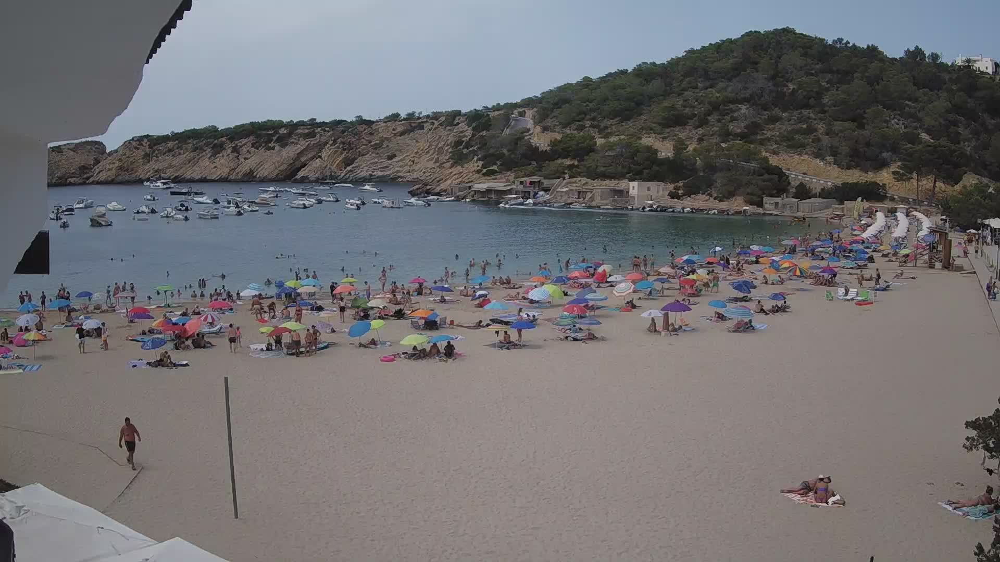

In [93]:
# An example of an image
img = cv2.imread(image_files[3], 1)
cv2_imshow(img)

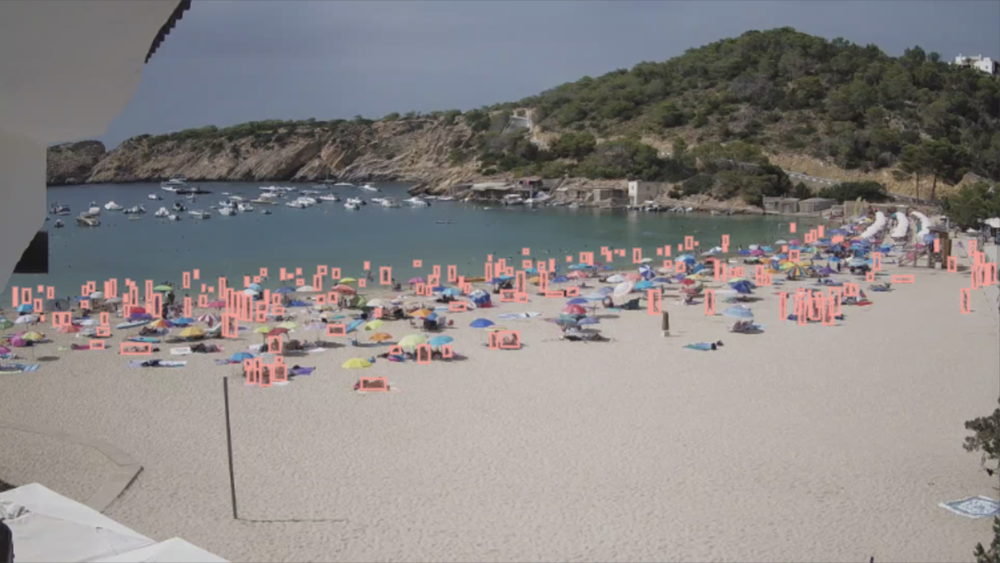

In [94]:
#An example of annotated version of the image
ann_images = glob.glob ("ImageAnalysisProject/annotated_examples/*.jpg")
a_img = cv2.imread(ann_images[2], 1)
cv2_imshow(a_img)

In [95]:
#Get label csv
df_labels = pd.read_csv('ImageAnalysisProject/personLabels.csv')
df_labels.sample(10)

,label_name,bbox_x,bbox_y,bbox_width,bbox_height,image_name,image_width,image_height
305,Person,92,547,8,19,1660474800.jpg,1920,1080
157,Person,865,581,23,17,1660467600.jpg,1920,1080
161,Person,1168,554,8,45,1660467600.jpg,1920,1080
493,Person,1214,648,31,20,1660478400.jpg,1920,1080
69,Person,68,552,18,31,1660467600.jpg,1920,1080
236,Person,1569,543,22,17,1660471200.jpg,1920,1080
613,Person,882,619,43,12,1660482000.jpg,1920,1080
294,Person,9,631,12,18,1660474800.jpg,1920,1080
616,Person,1246,611,12,27,1660482000.jpg,1920,1080
78,Person,973,930,49,78,1660467600.jpg,1920,1080


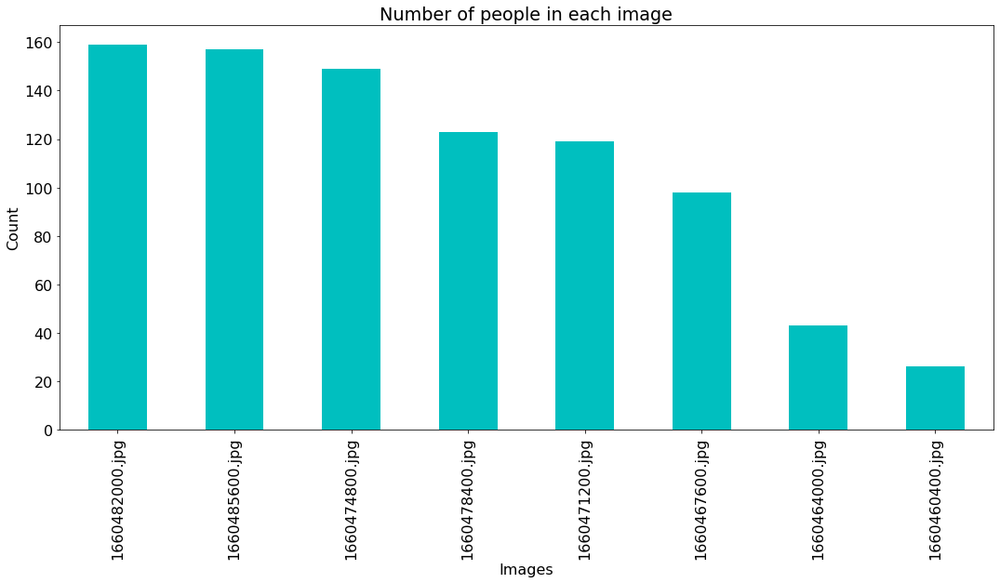

In [96]:
plt.figure()
plt.rcParams.update({'font.size': 16})
df_labels['image_name'].value_counts().plot(kind='bar',color="c",figsize=(18, 8),
                                            title="Number of people in each image",
                                            xlabel="Images", ylabel="Count")

In [97]:
#Image Files to Images
images = []
for fil in image_files:
    i = cv2.imread(fil, 1)
    images.append(i)
print("Images are ready to use")


Images are ready to use


# **Image Processing**

Several Techniques

## **Image Averaging**

Trying image averaging on two examples with one bright and one darker one

In [98]:
# Image 2 and Image 6 are the empty images so they will be used for averaging

#image 2 (darrkish empty)
d_empty_img = images[2]

#image 6 (brigthish empty)
b_empty_img = images[6]

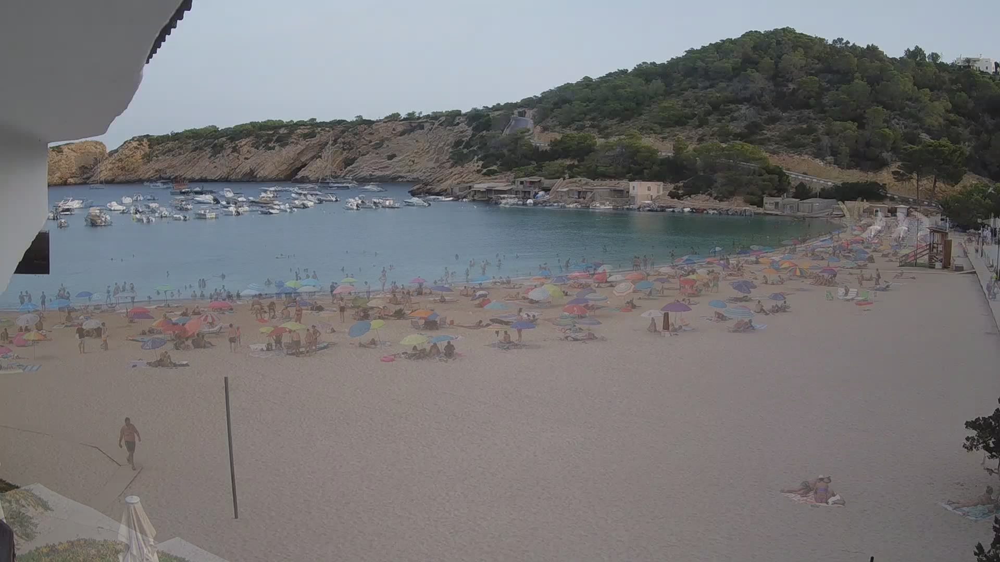

In [99]:
# Bright image example (images[3])

alpha = 0.4
beta = 1.0 - alpha

avg_image = images[3]
avg_image = cv2.addWeighted(images[3], alpha, b_empty_img, beta, 0.0)
cv2_imshow(avg_image)

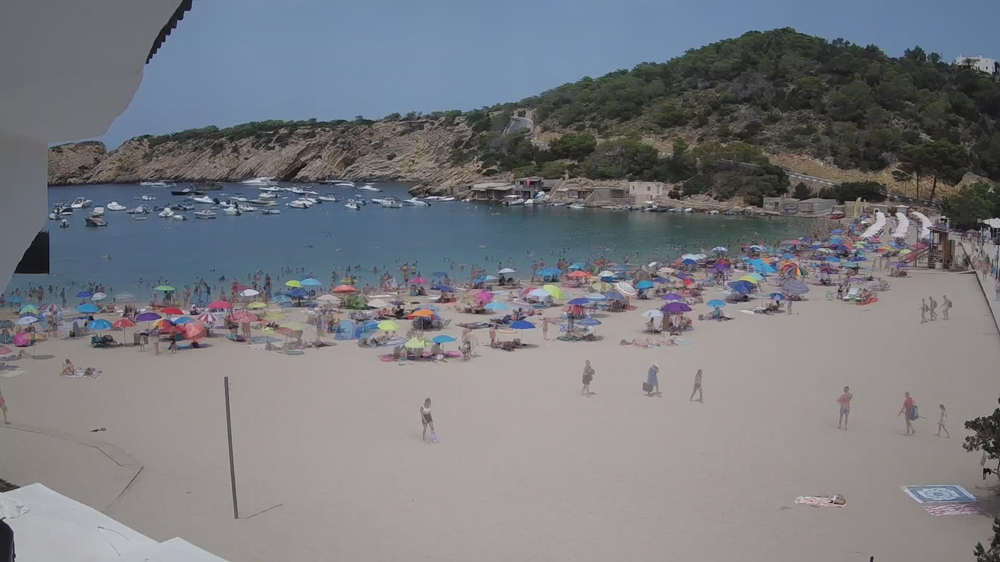

In [100]:
# Darker image example (images[8])

alpha = 0.4
beta = 1.0 - alpha

avg_image = images[8]

avg_image = cv2.addWeighted(images[8], alpha, d_empty_img, beta, 0.0)
cv2_imshow(avg_image)

## **Pixel-wise Comparison**

number of mismatched pixels 147599


(-0.5, 1919.5, 1079.5, -0.5)

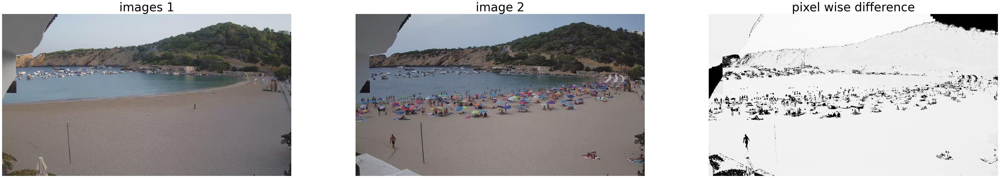

In [120]:
image1 = Image.open("/content/ImageAnalysisProject/data/1660456800.jpg")
image2 = Image.open("/content/ImageAnalysisProject/data/1660482000.jpg")

# Pixel-wise differences between two images are stored in "img_diff."
size = (1920,1080)
img_diff = Image.new("RGBA", size)
mismatch = pixelmatch(image1, image2, img_diff, threshold=0.2,includeAA=True,diff_color=[0, 0, 0])
print("number of mismatched pixels {}".format(mismatch))

# displaying results
fig = plt.figure(figsize=(60, 10))

#original image 1
plt.subplot(1, 3, 1)
plt.imshow(image1)
plt.title("images 1", fontsize=40)
plt.axis('off')

#original image 2
plt.subplot(1, 3, 2)
plt.imshow(image2)
plt.title("image 2", fontsize=40)
plt.axis('off')

plt.subplot(1, 3, 3)
#difference map
plt.imshow(img_diff)
plt.title("pixel wise difference", fontsize=40)
plt.axis('off')


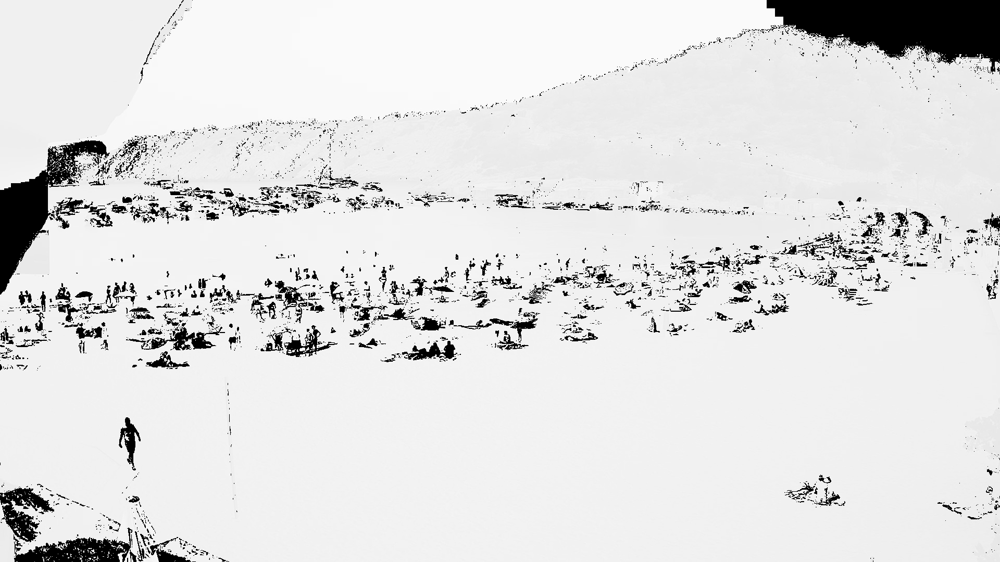

In [121]:
img_dif = asarray(img_diff)
cv2_imshow(img_dif)

## **Contour Detection**

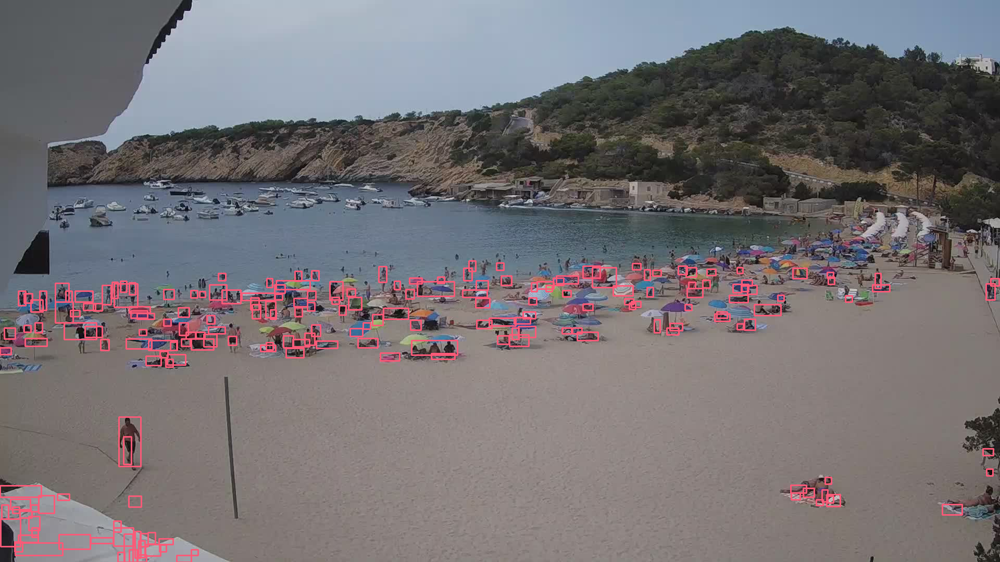

In [131]:
img_gray = cv2.cvtColor(img_dif, cv2.COLOR_BGR2GRAY)
# Find Canny edges
edged = cv2.Canny(img_gray, 30, 200)
  
# Finding Contours
# Use a copy of the image e.g. edged.copy()
# since findContours alters the image
contours, hierarchy = cv2.findContours(edged, 
    cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
frame = images[3].copy()  
for contour in contours:
    # Find bounding rectangles
    x,y,w,h = cv2.boundingRect(contour)
    # Draw the rectangle
    if (h>10 and w >10) and y>500:
      cv2.rectangle(frame,(x,y),(x+w,y+h),(120,90,250),2)

cv2_imshow(frame)